# Двойной маятник

## Базовый уровень

Фазовый вектор для двойного маятника $\mathbf x = \left(\theta_1, \theta_2, p_{\theta_1}, p_{\theta_2}\right)^T$.

Система уравнений имеет следующий вид

\begin{equation*}
\begin{cases}
\dot \theta_1 = \frac{6}{m l^2} \frac{2 p_{\theta_1} - 3 \cos(\theta_1 - \theta_2) p_{\theta_2}}{16 - 9 \cos^2(\theta_1 - \theta_2)}\\
\dot \theta_2 = \frac{6}{m l^2} \frac{8 p_{\theta_2} - 3 \cos(\theta_1 - \theta_2) p_{\theta_1}}{16 - 9 \cos^2(\theta_1 - \theta_2)}\\
\dot p_{\theta_1} = -\frac{1}{2} m l^2 \left(\dot \theta_1 \dot \theta_2 \sin(\theta_1 - \theta_2) + 3 \frac{g}{l} \sin \theta_1\right)\\
\dot p_{\theta_2} = -\frac{1}{2} m l^2 \left(- \dot \theta_1 \dot \theta_2 \sin(\theta_1 - \theta_2) + \frac{g}{l} \sin \theta_2\right).
\end{cases}
\end{equation*}

Или в векторном виде:

$$\dot {\mathbf x} = \mathbf f \left(\mathbf x\right),$$

где

\begin{equation*}
\mathbf f (\mathbf x) = \mathbf f \left(\theta_1, \theta_2, p_{\theta_1}, p_{\theta_2}\right)
= \begin{cases}
\frac{6}{m l^2} \frac{2 p_{\theta_1} - 3 \cos(\theta_1 - \theta_2) p_{\theta_2}}{16 - 9 \cos^2(\theta_1 - \theta_2)}\\
\frac{6}{m l^2} \frac{8 p_{\theta_2} - 3 \cos(\theta_1 - \theta_2) p_{\theta_1}}{16 - 9 \cos^2(\theta_1 - \theta_2)}\\
-\frac{1}{2} m l^2 \left(\dot \theta_1 \dot \theta_2 \sin(\theta_1 - \theta_2) + 3 \frac{g}{l} \sin \theta_1\right)\\
-\frac{1}{2} m l^2 \left(- \dot \theta_1 \dot \theta_2 \sin(\theta_1 - \theta_2) + \frac{g}{l} \sin \theta_2\right)
\end{cases}.
\end{equation*}

Для численного решения уравнения реализуем схему Рунге-Кутты 4 порядка:

$$\mathbf x^{i+1} = \mathbf x^i + \frac{\Delta t}{6} \left(\mathbf k_1 + 2 \mathbf k_2 + 2 \mathbf k_3 + \mathbf k_4\right)$$

\begin{equation*}
\begin{cases}
\mathbf k_1 = \mathbf f \left(\mathbf x^i\right)\\
\mathbf k_2 = \mathbf f \left(\mathbf x^i + \mathbf k_1 \frac{\Delta t}{2}\right)\\
\mathbf k_3 = \mathbf f \left(\mathbf x^i + \mathbf k_2 \frac{\Delta t}{2}\right)\\
\mathbf k_4 = \mathbf f \left(\mathbf x^i + \mathbf k_3 \Delta t\right)
\end{cases}
\end{equation*}


Импортируем необходимые модули.

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

Начальные условия и расчёт:

In [2]:
def f(x, m = 1.0, l = 1.0, g = 9.81):
    dot_theta_1 = 6.0 / (m * l ** 2) * (2 * x[2] - 3 * np.cos(x[0] - x[1]) * x[3])/(16.0 - 9 * np.cos(x[0] - x[1]) ** 2)
    dot_theta_2 = 6.0 / (m * l ** 2) * (8 * x[3] - 3 * np.cos(x[0] - x[1]) * x[0])/(16.0 - 9 * np.cos(x[0] - x[1]) ** 2)
    dot_p_theta_1 = -0.5 * m * l**2 * (dot_theta_1 * dot_theta_2 * np.sin(x[0] - x[1]) + 3 * g / l * np.sin(x[0]))
    dot_p_theta_2 = -0.5 * m * l**2 * (-dot_theta_1 * dot_theta_2 * np.sin(x[0] - x[1]) + g / l * np.sin(x[1]))
    return np.array([dot_theta_1,
                    dot_theta_2,
                    dot_p_theta_1,
                    dot_p_theta_2])

n_steps = 100
l = 1
T = 10.0
dt = T / n_steps
x0 = np.array([0.5, 1.0, 0.0, 0.0])
x = np.zeros((4, n_steps + 1))
x[:, 0] = x0

for i in range(n_steps):
    k1 = f(x[:, i])
    k2 = f(x[:, i] + dt / 2 * k1)
    k3 = f(x[:, i] + dt / 2 * k2)
    k4 = f(x[:, i] + dt * k3)
    x[:, i + 1] = x[:, i] + dt / 6 * (k1 + 2 * k2 + 2 * k3 + k4)

### Визуализация траектории двойного маятника

MovieWriter ffmpeg unavailable; using Pillow instead.


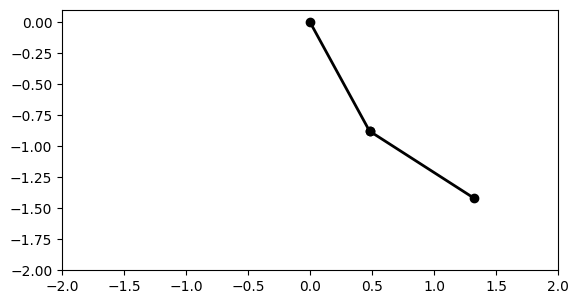

In [3]:
fig, ax = plt.subplots()
ax.set_xlim(-l*2, l*2)
ax.set_ylim(-l*2, l*0.1)
ax.set_aspect('equal')

line1, = ax.plot([], [], c='red', alpha=0.5)
line2, = ax.plot([0, l * math.sin(x0[0])], [0, -l * math.cos(x0[0])], 'o-', c='black', lw=2)
line3, = ax.plot([], [], c='blue', alpha=0.5)
line4, = ax.plot([l * math.sin(x0[0]), l * math.sin(x0[0]) + l * math.sin(x0[1])], [-l * math.cos(x0[0]), -l * math.cos(x0[0]) - l * math.cos(x0[1])], 'o-', c='black', lw=2)

def animate(i, x):
    line1.set_data(l * np.sin(x[0, :i+1]), -l * np.cos(x[0, :i+1]))
    line2.set_data([0, l * math.sin(x[0, i])], [0, -l * math.cos(x[0, i])])
    line3.set_data(l * np.sin(x[0, :i+1]) + l * np.sin(x[1, :i+1]), -l * np.cos(x[0, :i+1]) - l * np.cos(x[1, :i+1]))
    line4.set_data([l * math.sin(x[0, i]), l * math.sin(x[0, i]) + l * math.sin(x[1, i])], [-l * math.cos(x[0, i]), -l * math.cos(x[0, i]) - l * math.cos(x[1, i])])
    return line1, line2, line3, line4, 

ani = animation.FuncAnimation(fig, animate, frames=n_steps + 1, interval=100, fargs=(x,))

ani.save("double_pendulum.gif")

from IPython.display import HTML
HTML(ani.to_jshtml())

### Графики изменения углов

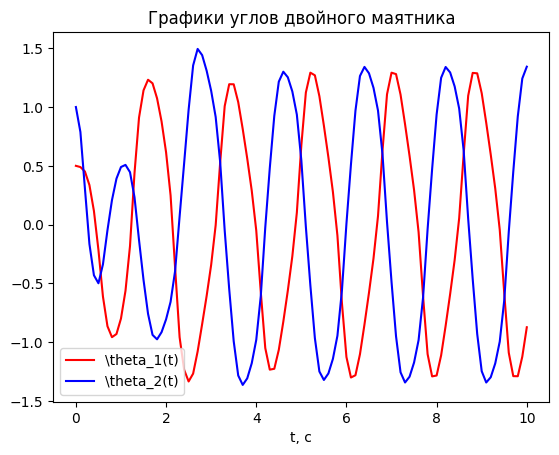

In [4]:
times = np.linspace(0, T, n_steps + 1)

fig = plt.figure()
plt.plot(times, x[0, :], c='red')
plt.plot(times, x[1, :], c='blue')
plt.legend([r'\theta_1(t)', r'\theta_2(t)'])
plt.title('Графики углов двойного маятника')
plt.xlabel('t, с')
plt.show()

### Визуализация при больших начальных углах

In [7]:
n_steps = 100
l = 1
T = 10.0
dt = T / n_steps
x0 = np.array([3, 3, 0, 0])
x = np.zeros((4, n_steps + 1))
x[:, 0] = x0

for i in range(n_steps):
    k1 = f(x[:, i])
    k2 = f(x[:, i] + dt / 2 * k1)
    k3 = f(x[:, i] + dt / 2 * k2)
    k4 = f(x[:, i] + dt * k3)
    x[:, i + 1] = x[:, i] + dt / 6 * (k1 + 2 * k2 + 2 * k3 + k4)

MovieWriter ffmpeg unavailable; using Pillow instead.


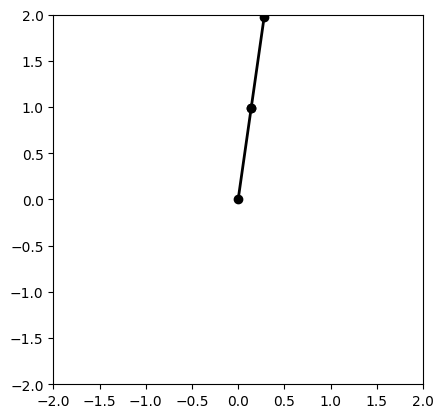

In [8]:
fig, ax = plt.subplots()
ax.set_xlim(-l*2, l*2)
ax.set_ylim(-l*2, l*2)
ax.set_aspect('equal')

line1, = ax.plot([], [], c='red', alpha=0.5)
line2, = ax.plot([0, l * math.sin(x0[0])], [0, -l * math.cos(x0[0])], 'o-', c='black', lw=2)
line3, = ax.plot([], [], c='blue', alpha=0.5)
line4, = ax.plot([l * math.sin(x0[0]), l * math.sin(x0[0]) + l * math.sin(x0[1])], [-l * math.cos(x0[0]), -l * math.cos(x0[0]) - l * math.cos(x0[1])], 'o-', c='black', lw=2)

def animate(i, x):
    line1.set_data(l * np.sin(x[0, :i+1]), -l * np.cos(x[0, :i+1]))
    line2.set_data([0, l * math.sin(x[0, i])], [0, -l * math.cos(x[0, i])])
    line3.set_data(l * np.sin(x[0, :i+1]) + l * np.sin(x[1, :i+1]), -l * np.cos(x[0, :i+1]) - l * np.cos(x[1, :i+1]))
    line4.set_data([l * math.sin(x[0, i]), l * math.sin(x[0, i]) + l * math.sin(x[1, i])], [-l * math.cos(x[0, i]), -l * math.cos(x[0, i]) - l * math.cos(x[1, i])])
    return line1, line2, line3, line4, 

ani = animation.FuncAnimation(fig, animate, frames=n_steps + 1, interval=100, fargs=(x,))

ani.save("double_pendulum.gif")

from IPython.display import HTML
HTML(ani.to_jshtml())